<a href="https://colab.research.google.com/github/poojavjpy/Locust-Detection/blob/main/HHO_on_fused_model_with_display.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Install required packages
!pip install torch torchvision
!pip install ultralytics  # For YOLOv8
!pip install yolov5      # For YOLOv5
!pip install opencv-python matplotlib
!pip install pandas
!pip install numpy

In [4]:
import ultralytics
print(ultralytics.__version__)

8.3.122


In [5]:
import numpy as np

class HarrisHawkOptimization:
    def __init__(self, obj_func, dim, n_hawks=10, max_iter=50, lb=0, ub=1):
        self.obj_func = obj_func
        self.dim = dim
        self.n_hawks = n_hawks
        self.max_iter = max_iter
        self.lb = lb
        self.ub = ub
        self.hawks = np.random.uniform(lb, ub, (n_hawks, dim))
        self.fitness = np.zeros(n_hawks)
        self.best_hawk = None
        self.best_fitness = float('inf')

    def optimize(self, *args):
        for t in range(self.max_iter):
            for i in range(self.n_hawks):
                self.fitness[i] = self.obj_func(self.hawks[i], *args)
                if self.fitness[i] < self.best_fitness:
                    self.best_fitness = self.fitness[i]
                    self.best_hawk = self.hawks[i].copy()

            rabbit_energy = 2 * (1 - t / self.max_iter)
            for i in range(self.n_hawks):
                r = np.random.random()
                if r >= 0.5 and rabbit_energy >= 0.5:  # Soft besiege
                    delta = self.best_hawk - self.hawks[i]
                    self.hawks[i] = delta - rabbit_energy * np.abs(delta) + self.hawks[i]
                elif r >= 0.5 and rabbit_energy < 0.5:  # Hard besiege
                    self.hawks[i] = self.best_hawk - rabbit_energy * np.abs(self.best_hawk - self.hawks[i])
                elif r < 0.5 and rabbit_energy >= 0.5:  # Soft besiege with progressive rapid dives
                    J = 2 * (1 - np.random.random())
                    Y = self.best_hawk - rabbit_energy * np.abs(J * self.best_hawk - self.hawks[i])
                    if self.obj_func(Y, *args) < self.fitness[i]:
                        self.hawks[i] = Y
                    else:
                        Z = Y + np.random.random(self.dim) * (self.ub - self.lb)
                        if self.obj_func(Z, *args) < self.fitness[i]:
                            self.hawks[i] = Z
                else:  # Hard besiege with progressive rapid dives
                    mean_hawk = np.mean(self.hawks, axis=0)
                    Y = self.best_hawk - rabbit_energy * np.abs(J * self.best_hawk - mean_hawk)
                    if self.obj_func(Y, *args) < self.fitness[i]:
                        self.hawks[i] = Y
                    else:
                        Z = Y + np.random.random(self.dim) * (self.ub - self.lb)
                        if self.obj_func(Z, *args) < self.fitness[i]:
                            self.hawks[i] = Z

                self.hawks[i] = np.clip(self.hawks[i], self.lb, self.ub)

        return self.best_hawk, self.best_fitness

In [6]:
import sys
import types
import torch
import numpy as np
from ultralytics import YOLO

# Create a module object for yolo_fusion
yolo_fusion = types.ModuleType('yolo_fusion')
sys.modules['yolo_fusion'] = yolo_fusion

# Define compute_iou function
def compute_iou(boxes1, boxes2):
    if boxes1.ndim == 1:
        boxes1 = boxes1[None, :]
    if boxes2.ndim == 1:
        boxes2 = boxes2[None, :]
    x1 = np.maximum(boxes1[:, 0], boxes2[:, 0])
    y1 = np.maximum(boxes1[:, 1], boxes2[:, 1])
    x2 = np.minimum(boxes1[:, 2], boxes2[:, 2])
    y2 = np.minimum(boxes1[:, 3], boxes2[:, 3])
    inter_area = np.maximum(0, x2 - x1) * np.maximum(0, y2 - y1)
    union_area = ((boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1]) +
                  (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1]) - inter_area)
    return inter_area / (union_area + 1e-6)

# Define HarrisHawkOptimization class
class HarrisHawkOptimization:
    def __init__(self, obj_func, dim, n_hawks=10, max_iter=50, lb=0, ub=1):
        self.obj_func = obj_func
        self.dim = dim
        self.n_hawks = n_hawks
        self.max_iter = max_iter
        self.lb = lb
        self.ub = ub
        self.hawks = np.random.uniform(lb, ub, (n_hawks, dim))
        self.fitness = np.zeros(n_hawks)
        self.best_hawk = None
        self.best_fitness = float('inf')

    def optimize(self, *args):
        for t in range(self.max_iter):
            for i in range(self.n_hawks):
                self.fitness[i] = self.obj_func(self.hawks[i], *args)
                if self.fitness[i] < self.best_fitness:
                    self.best_fitness = self.fitness[i]
                    self.best_hawk = self.hawks[i].copy()

            rabbit_energy = 2 * (1 - t / self.max_iter)
            for i in range(self.n_hawks):
                r = np.random.random()
                if r >= 0.5 and rabbit_energy >= 0.5:  # Soft besiege
                    delta = self.best_hawk - self.hawks[i]
                    self.hawks[i] = delta - rabbit_energy * np.abs(delta) + self.hawks[i]
                elif r >= 0.5 and rabbit_energy < 0.5:  # Hard besiege
                    self.hawks[i] = self.best_hawk - rabbit_energy * np.abs(self.best_hawk - self.hawks[i])
                elif r < 0.5 and rabbit_energy >= 0.5:  # Soft besiege with progressive rapid dives
                    J = 2 * (1 - np.random.random())
                    Y = self.best_hawk - rabbit_energy * np.abs(J * self.best_hawk - self.hawks[i])
                    if self.obj_func(Y, *args) < self.fitness[i]:
                        self.hawks[i] = Y
                    else:
                        Z = Y + np.random.random(self.dim) * (self.ub - self.lb)
                        if self.obj_func(Z, *args) < self.fitness[i]:
                            self.hawks[i] = Z
                else:  # Hard besiege with progressive rapid dives
                    mean_hawk = np.mean(self.hawks, axis=0)
                    Y = self.best_hawk - rabbit_energy * np.abs(J * self.best_hawk - mean_hawk)
                    if self.obj_func(Y, *args) < self.fitness[i]:
                        self.hawks[i] = Y
                    else:
                        Z = Y + np.random.random(self.dim) * (self.ub - self.lb)
                        if self.obj_func(Z, *args) < self.fitness[i]:
                            self.hawks[i] = Z

                self.hawks[i] = np.clip(self.hawks[i], self.lb, self.ub)

        return self.best_hawk, self.best_fitness

# Define YOLOFusion class
class YOLOFusion:
    def __init__(self, yolov5_model, yolov8_model):
        self.yolov5 = yolov5_model
        self.yolov8 = yolov8_model
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.yolov5.to(self.device)
        self.weights = None

    def objective_function(self, weights, v5_boxes, v5_scores, v5_classes, v8_boxes, v8_scores, v8_classes, gt_boxes, gt_classes, iou_thres=0.3):
        fused_boxes = v5_boxes.copy()
        fused_scores = v5_scores.copy()
        fused_classes = v5_classes.copy()

        for v8_box, v8_score, v8_cls in zip(v8_boxes, v8_scores, v8_classes):
            matched = False
            for j in range(len(fused_boxes)):
                iou = compute_iou(v8_box[None, :], fused_boxes[j][None, :])[0]
                if iou > iou_thres and v8_cls == fused_classes[j]:
                    fused_boxes[j] = (fused_boxes[j] * weights[0] * fused_scores[j] + v8_box * weights[1] * v8_score) / (weights[0] * fused_scores[j] + weights[1] * v8_score + 1e-6)
                    fused_scores[j] = max(fused_scores[j] * weights[0], v8_score * weights[1])
                    matched = True
                    break
            if not matched and v8_score * weights[1] > 0.05:
                fused_boxes = np.vstack([fused_boxes, v8_box])
                fused_scores = np.append(fused_scores, v8_score * weights[1] * 0.9)
                fused_classes = np.append(fused_classes, v8_cls)

        fused_scores = np.clip(fused_scores, 0, 1)
        metrics = self.evaluate_fusion((fused_boxes, fused_scores, fused_classes), (gt_boxes, gt_classes))
        return -metrics['mAP']  # Minimize negative mAP

    def evaluate_fusion(self, pred, gt, iou_threshold=0.2):
        pred_boxes, pred_scores, pred_classes = pred
        gt_boxes, gt_classes = gt
        tp, fp, fn = 0, 0, 0
        all_matches = []
        if len(pred_boxes) == 0 and len(gt_boxes) > 0:
            fn += len(gt_boxes)
        elif len(gt_boxes) == 0 and len(pred_boxes) > 0:
            fp += len(pred_boxes)
        elif len(gt_boxes) > 0 and len(pred_boxes) > 0:
            ious = np.zeros((len(pred_boxes), len(gt_boxes)))
            for i, p_box in enumerate(pred_boxes):
                for j, g_box in enumerate(gt_boxes):
                    ious[i, j] = compute_iou(p_box[None, :], g_box[None, :])[0]
            matched_gt = set()
            for i in np.argsort(pred_scores)[::-1]:
                if i >= len(ious):
                    fp += 1
                    continue
                max_iou = np.max(ious[i])
                if max_iou >= iou_threshold:
                    j = np.argmax(ious[i])
                    if j not in matched_gt and pred_classes[i] == gt_classes[j]:
                        tp += 1
                        matched_gt.add(j)
                        all_matches.append((pred_scores[i], 1))
                    else:
                        fp += 1
                        all_matches.append((pred_scores[i], 0))
                else:
                    fp += 1
                    all_matches.append((pred_scores[i], 0))
            fn += len(gt_boxes) - len(matched_gt)
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        all_matches = sorted(all_matches, key=lambda x: x[0], reverse=True)
        precisions = []
        recalls = []
        tp_cumsum = 0
        for i, (score, is_tp) in enumerate(all_matches):
            tp_cumsum += is_tp
            precisions.append(tp_cumsum / (i + 1))
            recalls.append(tp_cumsum / (tp + fn))
        ap = np.trapezoid(precisions, recalls) if recalls else 0
        return {"mAP": ap, "Precision": precision, "Recall": recall}

    def predict_batch(self, image_paths, ground_truths, conf_thres=0.05, iou_thres=0.3):
        results_v5 = self.yolov5(image_paths, size=300)
        results_v8 = self.yolov8.predict(image_paths, conf=conf_thres, iou=0.1, imgsz=300)

        v5_results, v8_results, fused_results = [], [], []
        for i, (image_path, gt) in enumerate(zip(image_paths, ground_truths)):
            pred_v5 = results_v5.pred[i]
            result_v8 = results_v8[i] if isinstance(results_v8, list) else results_v8

            v5_boxes = pred_v5[:, :4].cpu().numpy()
            v5_scores = pred_v5[:, 4].cpu().numpy()
            v5_classes = pred_v5[:, 5].cpu().numpy()
            v8_boxes = result_v8.boxes.xyxy.cpu().numpy()
            v8_scores = result_v8.boxes.conf.cpu().numpy()
            v8_classes = result_v8.boxes.cls.cpu().numpy()

            gt_boxes, gt_classes = gt

            # Optimize fusion weights using HHO
            hho = HarrisHawkOptimization(
                obj_func=self.objective_function,
                dim=2,  # Weights for YOLOv5 and YOLOv8
                n_hawks=10,
                max_iter=20,
                lb=0,
                ub=1
            )
            best_weights, _ = hho.optimize(v5_boxes, v5_scores, v5_classes, v8_boxes, v8_scores, v8_classes, gt_boxes, gt_classes, iou_thres)
            print(f"Optimized Weights for {os.path.basename(image_path)}: YOLOv5={best_weights[0]:.3f}, YOLOv8={best_weights[1]:.3f}")

            # Fuse predictions using optimized weights
            fused_boxes = v5_boxes.copy()
            fused_scores = v5_scores.copy()
            fused_classes = v5_classes.copy()

            for v8_box, v8_score, v8_cls in zip(v8_boxes, v8_scores, v8_classes):
                matched = False
                for j in range(len(fused_boxes)):
                    iou = compute_iou(v8_box[None, :], fused_boxes[j][None, :])[0]
                    if iou > iou_thres and v8_cls == fused_classes[j]:
                        fused_boxes[j] = (fused_boxes[j] * best_weights[0] * fused_scores[j] + v8_box * best_weights[1] * v8_score) / (best_weights[0] * fused_scores[j] + best_weights[1] * v8_score + 1e-6)
                        fused_scores[j] = max(fused_scores[j] * best_weights[0], v8_score * best_weights[1])
                        matched = True
                        break
                if not matched and v8_score * best_weights[1] > conf_thres:
                    fused_boxes = np.vstack([fused_boxes, v8_box])
                    fused_scores = np.append(fused_scores, v8_score * best_weights[1] * 0.9)
                    fused_classes = np.append(fused_classes, v8_cls)

            fused_scores = np.clip(fused_scores, 0, 1)

            v5_results.append((v5_boxes, v5_scores, v5_classes))
            v8_results.append((v8_boxes, v8_scores, v8_classes))
            fused_results.append((fused_boxes, fused_scores, fused_classes))

        return v5_results, v8_results, fused_results

    def process_results(self, boxes, scores, classes, conf_thres=0.05):
        if len(scores) == 0:
            return np.array([]), np.array([]), np.array([])
        mask = scores >= conf_thres
        return boxes[mask], scores[mask], classes[mask]

# Attach classes and functions to the yolo_fusion module
yolo_fusion.compute_iou = compute_iou
yolo_fusion.HarrisHawkOptimization = HarrisHawkOptimization
yolo_fusion.YOLOFusion = YOLOFusion

# Verify module registration
print("yolo_fusion module defined:", 'yolo_fusion' in sys.modules)

yolo_fusion module defined: True


In [7]:
import sys
print('yolo_fusion' in sys.modules)
from yolo_fusion import YOLOFusion, compute_iou
print("YOLOFusion and compute_iou successfully imported!")

True
YOLOFusion and compute_iou successfully imported!


In [8]:
from yolo_fusion import YOLOFusion, compute_iou
print(hasattr(YOLOFusion, '__init__'))
print(hasattr(YOLOFusion, 'predict_batch'))
print(callable(compute_iou))

True
True
True


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loading custom models...


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2025-5-1 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


Found 29 images: ['/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 1.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 10.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 11.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 12.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 13.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 14.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 15.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 16.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 17.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 18.jpg', '/content/dri

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):



WARNING ⚠️ imgsz=[300] must be multiple of max stride 32, updating to [320]
0: 320x320 1 Locust, 1.3ms
1: 320x320 1 Locust, 1.3ms
2: 320x320 1 Locust, 1.3ms
3: 320x320 1 Locust, 1.3ms
4: 320x320 1 Locust, 1.3ms
5: 320x320 1 Locust, 1.3ms
6: 320x320 1 Locust, 1.3ms
7: 320x320 1 Locust, 1.3ms
8: 320x320 1 Locust, 1.3ms
9: 320x320 1 Locust, 1.3ms
10: 320x320 1 Locust, 1.3ms
11: 320x320 2 Locusts, 1.3ms
12: 320x320 1 Locust, 1.3ms
13: 320x320 2 Locusts, 1.3ms
14: 320x320 1 Locust, 1.3ms
15: 320x320 1 Locust, 1.3ms
16: 320x320 1 Locust, 1.3ms
17: 320x320 1 Locust, 1.3ms
18: 320x320 1 Locust, 1.3ms
19: 320x320 1 Locust, 1.3ms
20: 320x320 1 Locust, 1.3ms
21: 320x320 3 Locusts, 1.3ms
22: 320x320 2 Locusts, 1.3ms
23: 320x320 1 Locust, 1.3ms
24: 320x320 1 Locust, 1.3ms
25: 320x320 1 Locust, 1.3ms
26: 320x320 1 Locust, 1.3ms
27: 320x320 1 Locust, 1.3ms
28: 320x320 1 Locust, 1.3ms
Speed: 1.1ms preprocess, 1.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
Optimized Weights for

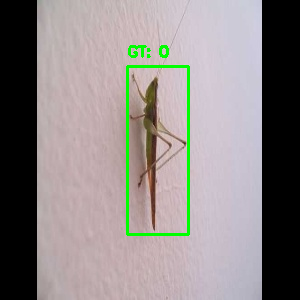


YOLOv8 Results:
Class: 0, Confidence: 0.620, Box: [     113.14      12.276      196.86      236.46]

YOLOv8 Predictions (Copy of 1.jpg):


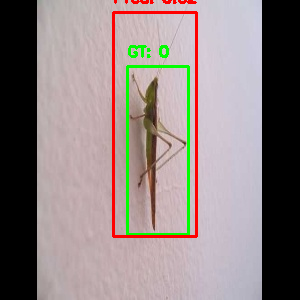


Fused Results:
Class: 0, Confidence: 0.169, Box: [     113.14      12.276      196.86      236.46]

Fused Model Predictions (Copy of 1.jpg):


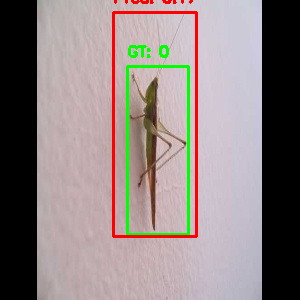


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 10.jpg

YOLOv5 Results:

YOLOv5 Predictions (Copy of 10.jpg):


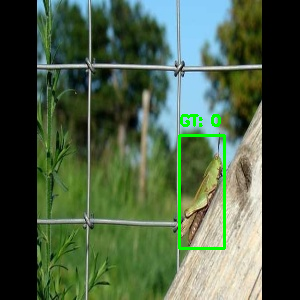


YOLOv8 Results:
Class: 0, Confidence: 0.436, Box: [      147.7      88.723      263.67       299.6]

YOLOv8 Predictions (Copy of 10.jpg):


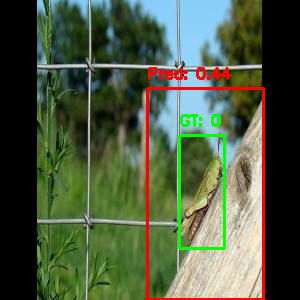


Fused Results:
Class: 0, Confidence: 0.390, Box: [      147.7      88.723      263.67       299.6]

Fused Model Predictions (Copy of 10.jpg):


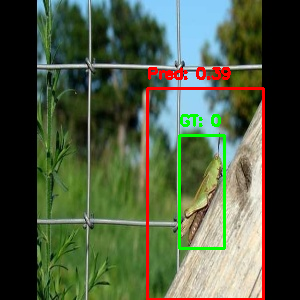


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 11.jpg

YOLOv5 Results:

YOLOv5 Predictions (Copy of 11.jpg):


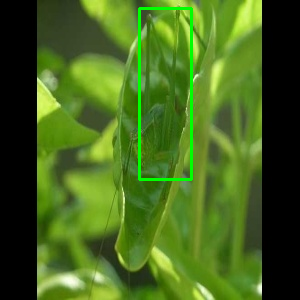


YOLOv8 Results:
Class: 0, Confidence: 0.111, Box: [     65.844           0      244.44         291]

YOLOv8 Predictions (Copy of 11.jpg):


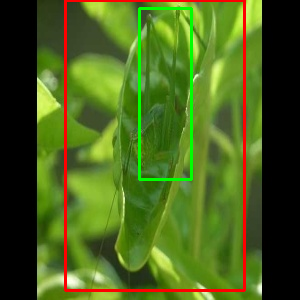


Fused Results:
Class: 0, Confidence: 0.088, Box: [     65.844           0      244.44         291]

Fused Model Predictions (Copy of 11.jpg):


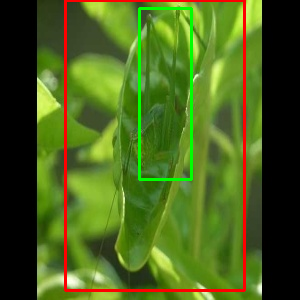


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 12.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.838, Box: [     72.894      23.549      211.25      249.86]

YOLOv5 Predictions (Copy of 12.jpg):


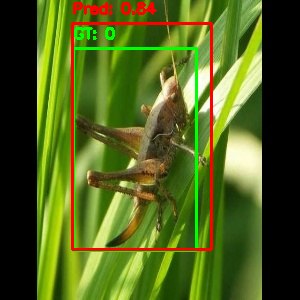


YOLOv8 Results:
Class: 0, Confidence: 0.740, Box: [      76.32       14.19      212.94      263.12]

YOLOv8 Predictions (Copy of 12.jpg):


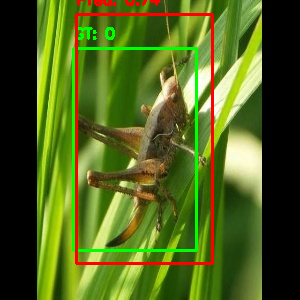


Fused Results:
Class: 0, Confidence: 0.582, Box: [     75.384      16.746      212.48       259.5]

Fused Model Predictions (Copy of 12.jpg):


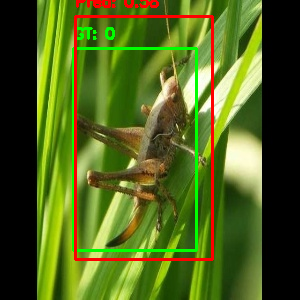


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 13.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.732, Box: [     65.042      56.553       245.2      238.52]

YOLOv5 Predictions (Copy of 13.jpg):


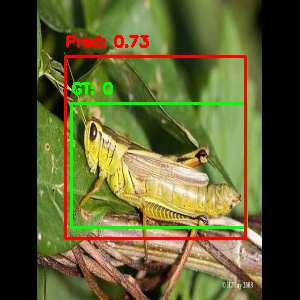


YOLOv8 Results:
Class: 0, Confidence: 0.748, Box: [     59.319      49.339      251.37      229.17]

YOLOv8 Predictions (Copy of 13.jpg):


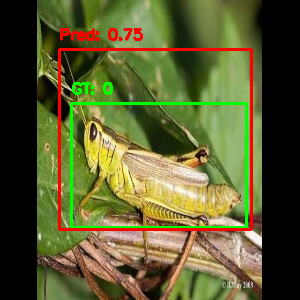


Fused Results:
Class: 0, Confidence: 0.405, Box: [      61.47       52.05      249.05      232.68]

Fused Model Predictions (Copy of 13.jpg):


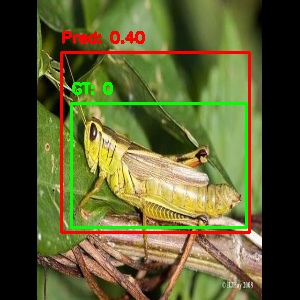


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 14.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.766, Box: [     71.317      85.539      191.76      249.02]

YOLOv5 Predictions (Copy of 14.jpg):


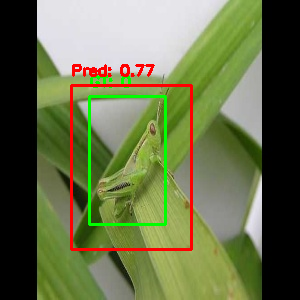


YOLOv8 Results:
Class: 0, Confidence: 0.686, Box: [      77.14      74.588      192.36      292.33]

YOLOv8 Predictions (Copy of 14.jpg):


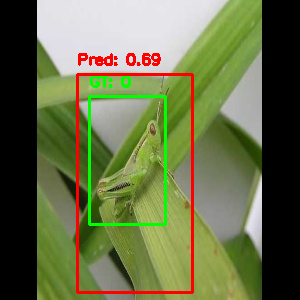


Fused Results:
Class: 0, Confidence: 0.589, Box: [     74.256      80.011      192.06      270.88]

Fused Model Predictions (Copy of 14.jpg):


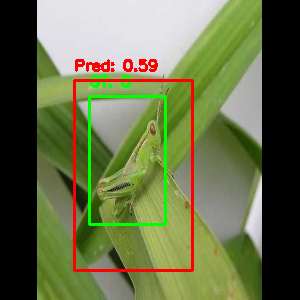


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 15.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.270, Box: [     64.483      52.624      208.79      207.14]

YOLOv5 Predictions (Copy of 15.jpg):


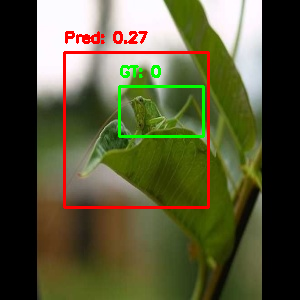


YOLOv8 Results:
Class: 0, Confidence: 0.677, Box: [     66.281      50.622      183.04      180.32]

YOLOv8 Predictions (Copy of 15.jpg):


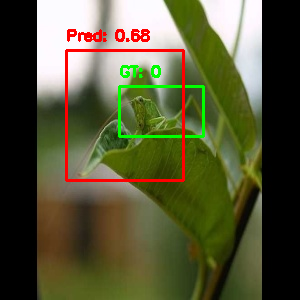


Fused Results:
Class: 0, Confidence: 0.270, Box: [     64.926       52.13      202.45      200.53]

Fused Model Predictions (Copy of 15.jpg):


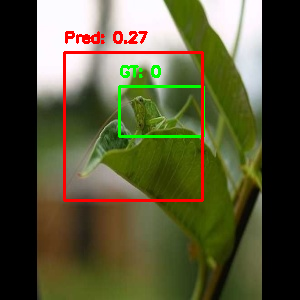


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 16.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.895, Box: [     76.786      73.595      262.33      249.14]

YOLOv5 Predictions (Copy of 16.jpg):


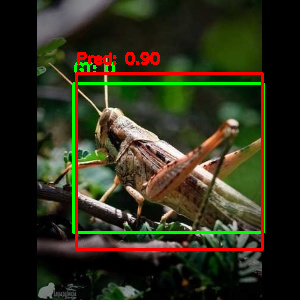


YOLOv8 Results:
Class: 0, Confidence: 0.759, Box: [     62.928      60.024      257.62       242.7]

YOLOv8 Predictions (Copy of 16.jpg):


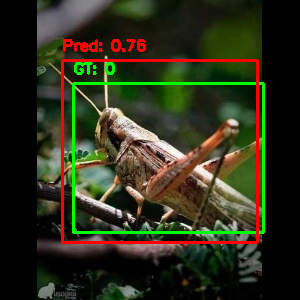


Fused Results:
Class: 0, Confidence: 0.401, Box: [     65.589       62.63      258.52      243.93]

Fused Model Predictions (Copy of 16.jpg):


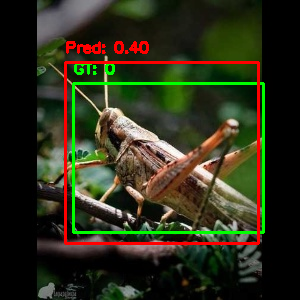


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 17.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.562, Box: [     168.79      42.923       250.6      260.47]

YOLOv5 Predictions (Copy of 17.jpg):


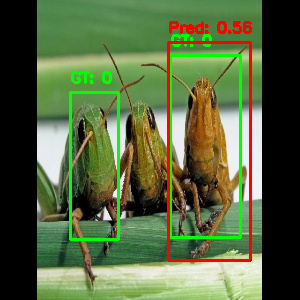


YOLOv8 Results:
Class: 0, Confidence: 0.562, Box: [      89.04      38.605       243.5      260.32]

YOLOv8 Predictions (Copy of 17.jpg):


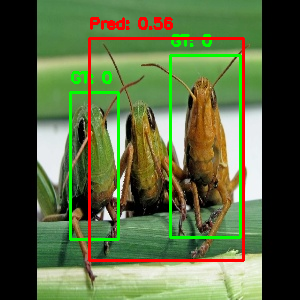


Fused Results:
Class: 0, Confidence: 0.285, Box: [     118.43      40.196      246.11      260.37]

Fused Model Predictions (Copy of 17.jpg):


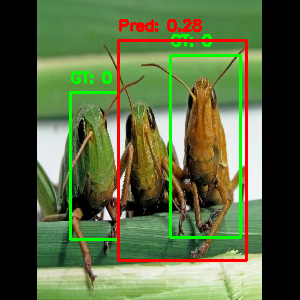


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 18.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.873, Box: [     67.774       66.94      244.08      240.76]

YOLOv5 Predictions (Copy of 18.jpg):


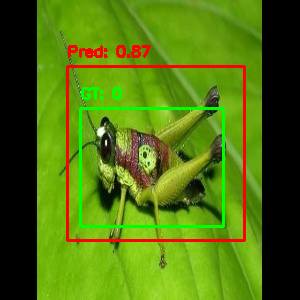


YOLOv8 Results:
Class: 0, Confidence: 0.790, Box: [     68.413      60.729       250.6      268.94]

YOLOv8 Predictions (Copy of 18.jpg):


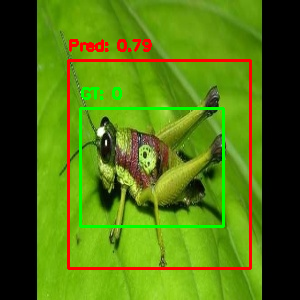


Fused Results:
Class: 0, Confidence: 0.522, Box: [     68.387      60.981      250.34       267.8]

Fused Model Predictions (Copy of 18.jpg):


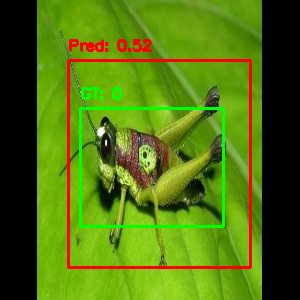


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 19.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.920, Box: [     45.166      106.94      213.82      212.49]

YOLOv5 Predictions (Copy of 19.jpg):


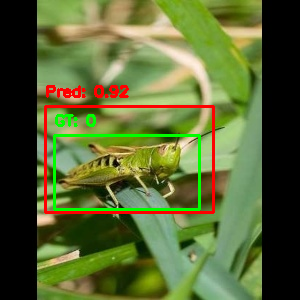


YOLOv8 Results:
Class: 0, Confidence: 0.734, Box: [     55.318      112.54      228.04      206.29]

YOLOv8 Predictions (Copy of 19.jpg):


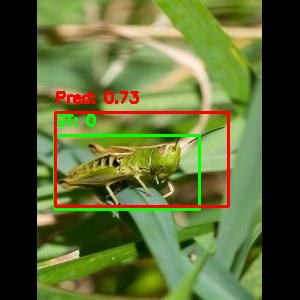


Fused Results:
Class: 0, Confidence: 0.535, Box: [     50.637      109.96      221.49      209.15]

Fused Model Predictions (Copy of 19.jpg):


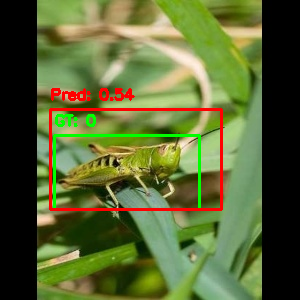


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 20.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.288, Box: [     80.089      26.917      196.95      257.64]

YOLOv5 Predictions (Copy of 20.jpg):


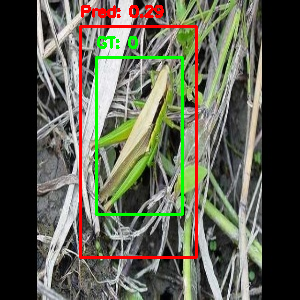


YOLOv8 Results:
Class: 0, Confidence: 0.362, Box: [     92.278      4.0025       182.6       216.5]
Class: 0, Confidence: 0.051, Box: [     213.53     0.35052      279.16      178.14]

YOLOv8 Predictions (Copy of 20.jpg):


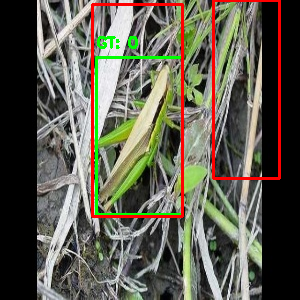


Fused Results:
Class: 0, Confidence: 0.247, Box: [      90.54      7.2693      184.64      222.37]

Fused Model Predictions (Copy of 20.jpg):


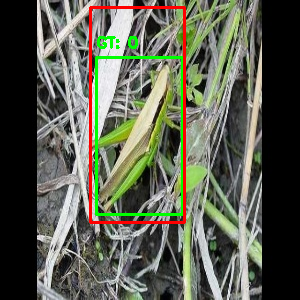


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 21.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.909, Box: [     118.03      48.313      258.34      170.81]

YOLOv5 Predictions (Copy of 21.jpg):


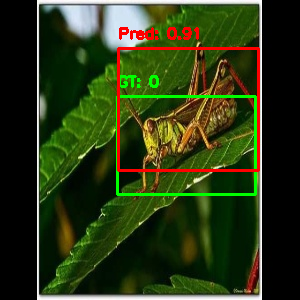


YOLOv8 Results:
Class: 0, Confidence: 0.755, Box: [     124.54      39.021      256.63      174.57]

YOLOv8 Predictions (Copy of 21.jpg):


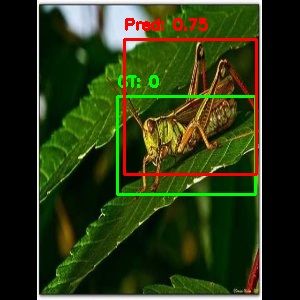


Fused Results:
Class: 0, Confidence: 0.678, Box: [     119.65      46.004      257.92      171.74]

Fused Model Predictions (Copy of 21.jpg):


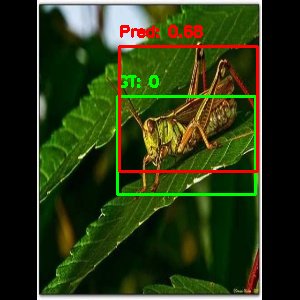


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 23.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.361, Box: [     108.24      155.59      151.33      270.94]

YOLOv5 Predictions (Copy of 23.jpg):


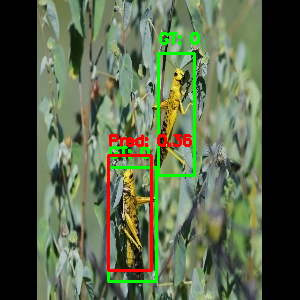


YOLOv8 Results:
Class: 0, Confidence: 0.515, Box: [      104.8      152.88      164.05      282.86]
Class: 0, Confidence: 0.289, Box: [     162.06      1.7353      231.84       148.3]

YOLOv8 Predictions (Copy of 23.jpg):


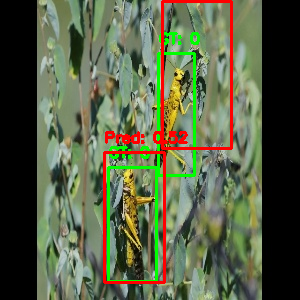


Fused Results:
Class: 0, Confidence: 0.458, Box: [     105.93      153.77      159.88      278.95]
Class: 0, Confidence: 0.231, Box: [     162.06      1.7353      231.84       148.3]

Fused Model Predictions (Copy of 23.jpg):


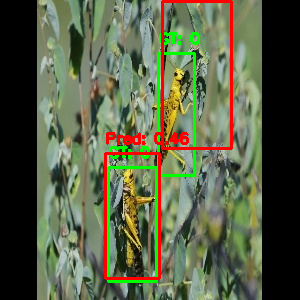


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 24.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.915, Box: [     76.212      73.152      261.92         251]

YOLOv5 Predictions (Copy of 24.jpg):


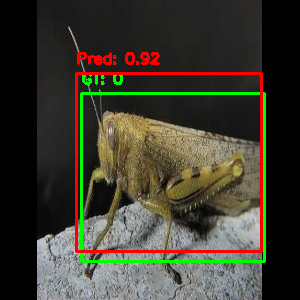


YOLOv8 Results:
Class: 0, Confidence: 0.754, Box: [     74.992      61.681      257.55      243.96]

YOLOv8 Predictions (Copy of 24.jpg):


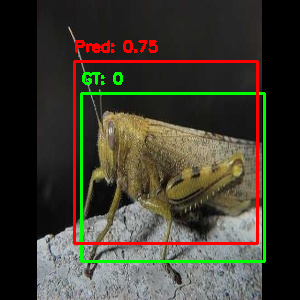


Fused Results:
Class: 0, Confidence: 0.481, Box: [     75.194      63.584      258.28      245.13]

Fused Model Predictions (Copy of 24.jpg):


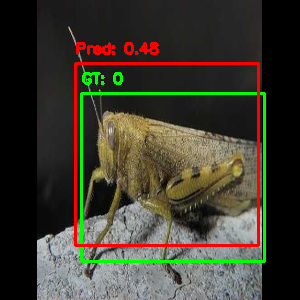


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 25.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.314, Box: [     121.04      50.415      173.22      228.34]

YOLOv5 Predictions (Copy of 25.jpg):


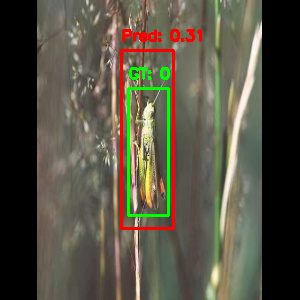


YOLOv8 Results:
Class: 0, Confidence: 0.533, Box: [     121.58      42.953      178.67      226.74]

YOLOv8 Predictions (Copy of 25.jpg):


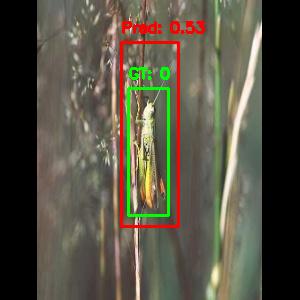


Fused Results:
Class: 0, Confidence: 0.263, Box: [     121.21      48.126      174.89      227.85]

Fused Model Predictions (Copy of 25.jpg):


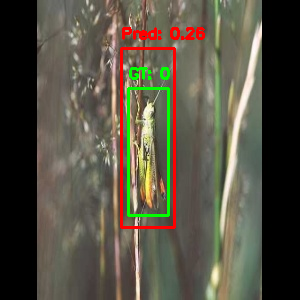


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 26.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.778, Box: [     61.715      15.131      249.43      289.13]

YOLOv5 Predictions (Copy of 26.jpg):


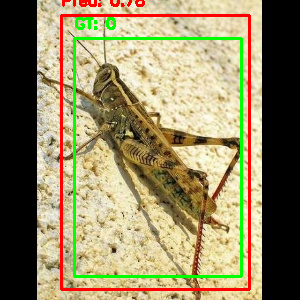


YOLOv8 Results:
Class: 0, Confidence: 0.777, Box: [     63.347      14.839      248.61      245.63]

YOLOv8 Predictions (Copy of 26.jpg):


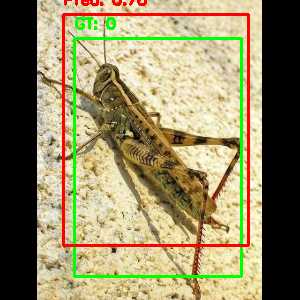


Fused Results:
Class: 0, Confidence: 0.348, Box: [     62.242      15.037      249.17      275.07]

Fused Model Predictions (Copy of 26.jpg):


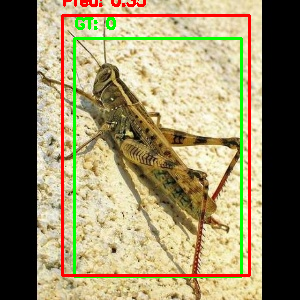


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 27.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.742, Box: [     94.781       50.77       169.3      289.95]

YOLOv5 Predictions (Copy of 27.jpg):


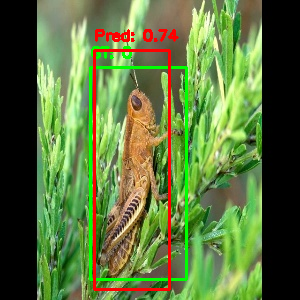


YOLOv8 Results:
Class: 0, Confidence: 0.686, Box: [     95.389      51.392      177.99      284.93]

YOLOv8 Predictions (Copy of 27.jpg):


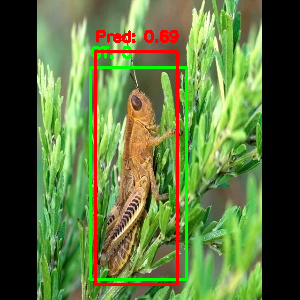


Fused Results:
Class: 0, Confidence: 0.667, Box: [     94.962      50.955      171.89      288.46]

Fused Model Predictions (Copy of 27.jpg):


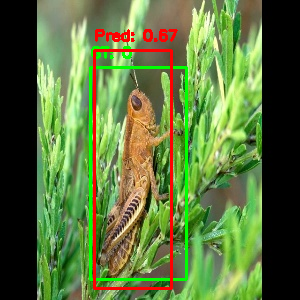


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 28.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.513, Box: [     75.862        58.7      156.54      265.96]

YOLOv5 Predictions (Copy of 28.jpg):


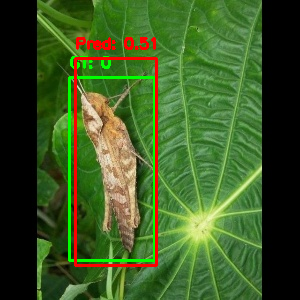


YOLOv8 Results:
Class: 0, Confidence: 0.751, Box: [     67.072      49.276      175.82      270.73]

YOLOv8 Predictions (Copy of 28.jpg):


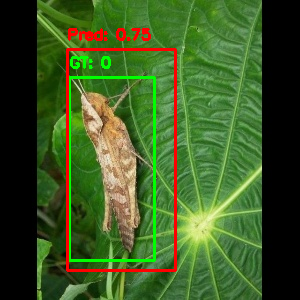


Fused Results:
Class: 0, Confidence: 0.494, Box: [     71.992      54.551      165.03      268.06]

Fused Model Predictions (Copy of 28.jpg):


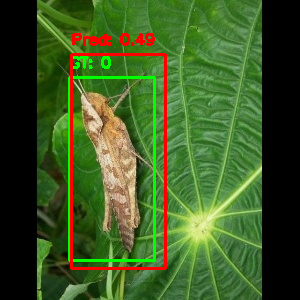


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 29.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.665, Box: [     79.106      26.901      247.75       249.8]

YOLOv5 Predictions (Copy of 29.jpg):


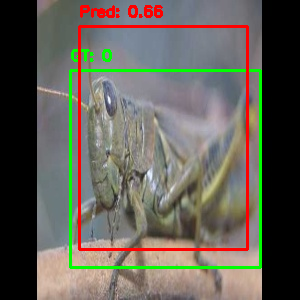


YOLOv8 Results:
Class: 0, Confidence: 0.766, Box: [     64.533      35.238      258.13      279.66]

YOLOv8 Predictions (Copy of 29.jpg):


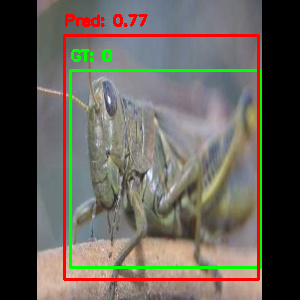


Fused Results:
Class: 0, Confidence: 0.426, Box: [     71.706      31.135      253.02      264.96]

Fused Model Predictions (Copy of 29.jpg):


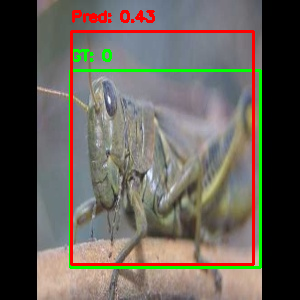


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 3.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.723, Box: [     84.336      31.044      232.11      255.86]

YOLOv5 Predictions (Copy of 3.jpg):


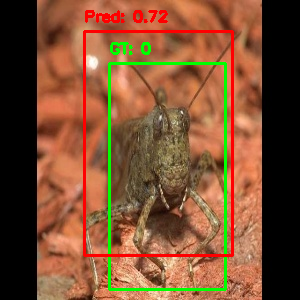


YOLOv8 Results:
Class: 0, Confidence: 0.690, Box: [     73.532       52.23      222.25      291.19]

YOLOv8 Predictions (Copy of 3.jpg):


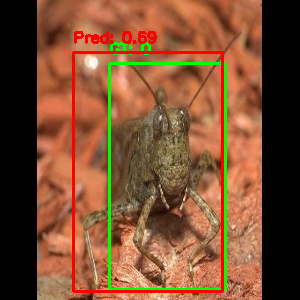


Fused Results:
Class: 0, Confidence: 0.441, Box: [     74.812      49.721      223.42         287]

Fused Model Predictions (Copy of 3.jpg):


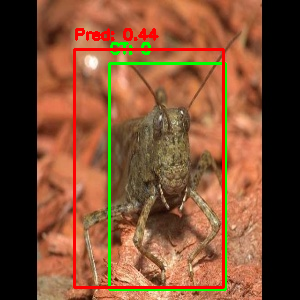


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 31.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.828, Box: [     106.85      96.371      142.43      124.86]
Class: 0, Confidence: 0.364, Box: [     75.385      132.06      122.89       169.2]
Class: 0, Confidence: 0.283, Box: [     160.94      199.19      216.38      228.05]

YOLOv5 Predictions (Copy of 31.jpg):


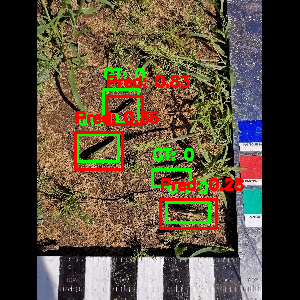


YOLOv8 Results:
Class: 0, Confidence: 0.802, Box: [     77.875      132.71      132.51      168.91]
Class: 0, Confidence: 0.508, Box: [     105.07      94.683      142.35      123.55]
Class: 0, Confidence: 0.135, Box: [     152.21      171.42      191.39      192.54]

YOLOv8 Predictions (Copy of 31.jpg):


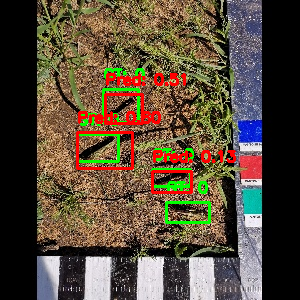


Fused Results:
Class: 0, Confidence: 0.667, Box: [     106.23       95.78       142.4       124.4]
Class: 0, Confidence: 0.567, Box: [     77.027      132.49      129.23      169.01]
Class: 0, Confidence: 0.283, Box: [     160.94      199.19      216.38      228.05]
Class: 0, Confidence: 0.086, Box: [     152.21      171.42      191.39      192.54]

Fused Model Predictions (Copy of 31.jpg):


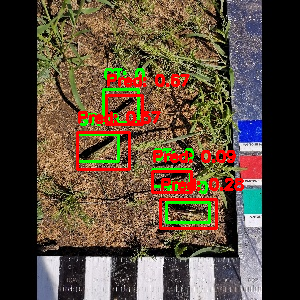


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 32.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.723, Box: [     89.872      181.92      146.34      231.92]
Class: 0, Confidence: 0.295, Box: [     79.545       113.7       106.6      160.64]

YOLOv5 Predictions (Copy of 32.jpg):


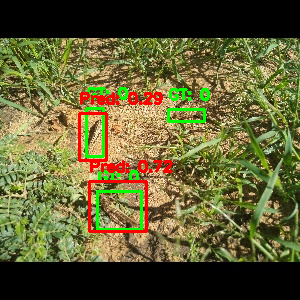


YOLOv8 Results:
Class: 0, Confidence: 0.110, Box: [     32.257      108.08      75.024      139.19]
Class: 0, Confidence: 0.093, Box: [      81.45      107.92      104.12      157.24]

YOLOv8 Predictions (Copy of 32.jpg):


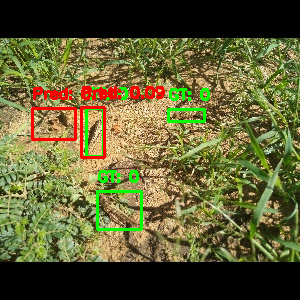


Fused Results:
Class: 0, Confidence: 0.723, Box: [     89.872      181.92      146.34      231.92]
Class: 0, Confidence: 0.233, Box: [     79.813      112.88      106.25      160.16]

Fused Model Predictions (Copy of 32.jpg):


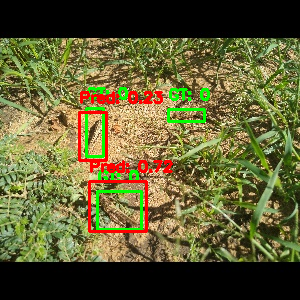


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 4.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.830, Box: [     112.91      56.077       224.1      235.22]

YOLOv5 Predictions (Copy of 4.jpg):


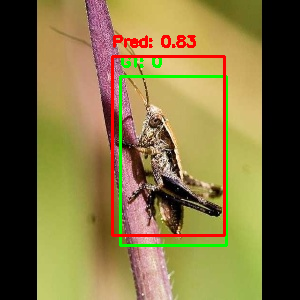


YOLOv8 Results:
Class: 0, Confidence: 0.687, Box: [     121.45      61.329       222.2       224.7]

YOLOv8 Predictions (Copy of 4.jpg):


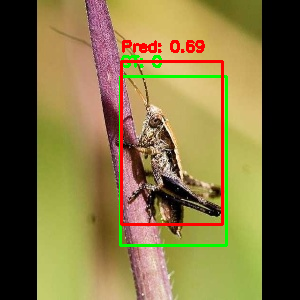


Fused Results:
Class: 0, Confidence: 0.623, Box: [     121.11      61.119      222.27      225.12]

Fused Model Predictions (Copy of 4.jpg):


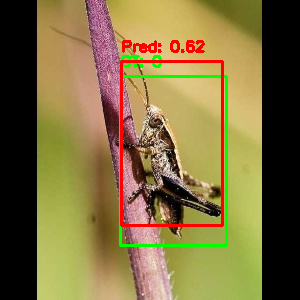


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 5.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.607, Box: [     62.862       8.175      212.68      233.12]

YOLOv5 Predictions (Copy of 5.jpg):


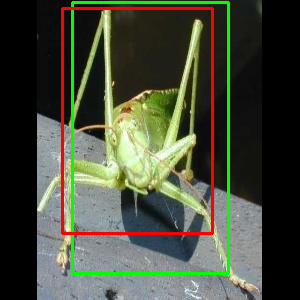


YOLOv8 Results:
Class: 0, Confidence: 0.756, Box: [     51.694      9.3248      243.09      260.78]

YOLOv8 Predictions (Copy of 5.jpg):


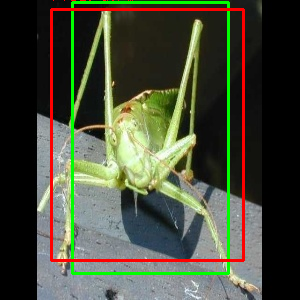


Fused Results:
Class: 0, Confidence: 0.402, Box: [     58.269      8.6478      225.19       244.5]

Fused Model Predictions (Copy of 5.jpg):


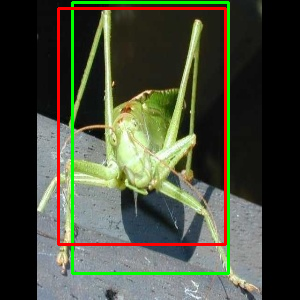


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 6.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.662, Box: [     67.152      50.211      189.42       226.2]

YOLOv5 Predictions (Copy of 6.jpg):


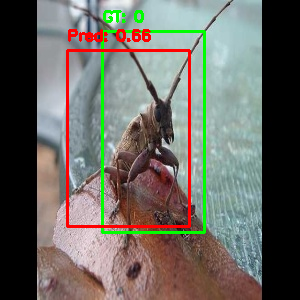


YOLOv8 Results:
Class: 0, Confidence: 0.674, Box: [     72.795      42.102      198.98      235.26]

YOLOv8 Predictions (Copy of 6.jpg):


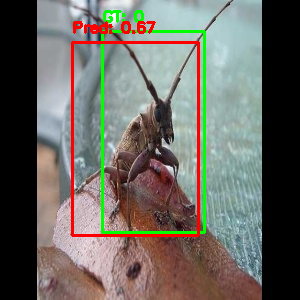


Fused Results:
Class: 0, Confidence: 0.471, Box: [     69.441      46.922       193.3      229.88]

Fused Model Predictions (Copy of 6.jpg):


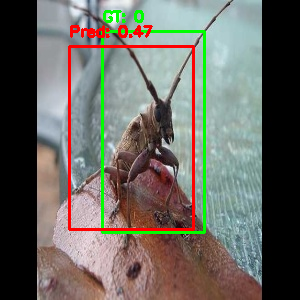


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 7.jpg

YOLOv5 Results:

YOLOv5 Predictions (Copy of 7.jpg):


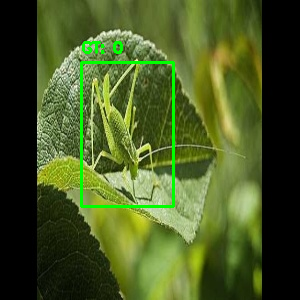


YOLOv8 Results:
Class: 0, Confidence: 0.495, Box: [     97.825      12.465      235.91      197.35]

YOLOv8 Predictions (Copy of 7.jpg):


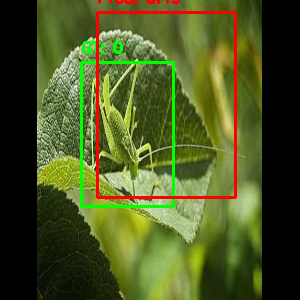


Fused Results:
Class: 0, Confidence: 0.151, Box: [     97.825      12.465      235.91      197.35]

Fused Model Predictions (Copy of 7.jpg):


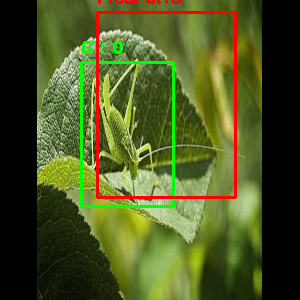


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 8.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.541, Box: [        111      2.4268      179.91       248.8]

YOLOv5 Predictions (Copy of 8.jpg):


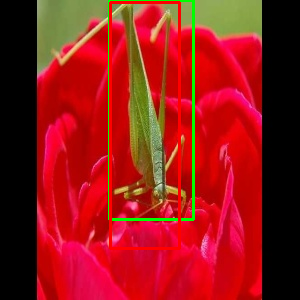


YOLOv8 Results:
Class: 0, Confidence: 0.672, Box: [     84.603      0.3826      205.99      215.29]

YOLOv8 Predictions (Copy of 8.jpg):


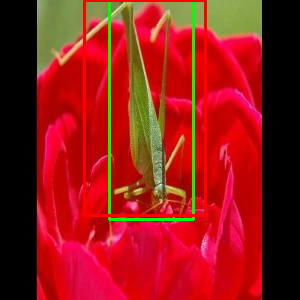


Fused Results:
Class: 0, Confidence: 0.595, Box: [     91.109     0.88656      199.56      223.55]

Fused Model Predictions (Copy of 8.jpg):


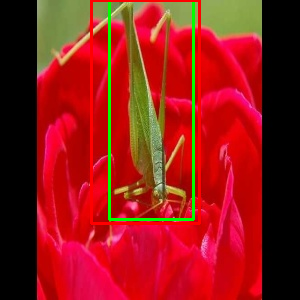


Testing on: /content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 9.jpg

YOLOv5 Results:
Class: 0, Confidence: 0.881, Box: [     34.005      77.194      235.93      289.74]

YOLOv5 Predictions (Copy of 9.jpg):


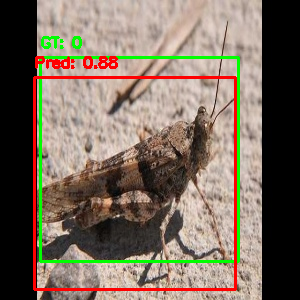


YOLOv8 Results:
Class: 0, Confidence: 0.764, Box: [     37.952      76.959       234.3      257.61]

YOLOv8 Predictions (Copy of 9.jpg):


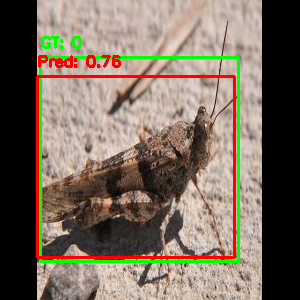


Fused Results:
Class: 0, Confidence: 0.836, Box: [     35.358      77.113      235.37      278.73]

Fused Model Predictions (Copy of 9.jpg):


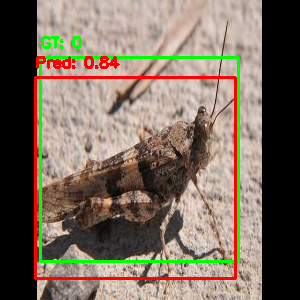


Debug Info:
YOLOv5 - TP: 27, FP: 1, FN: 9
YOLOv8 - TP: 30, FP: 4, FN: 6
Fused - TP: 33, FP: 1, FN: 3

Comparison Table:
      Model      mAP  Precision   Recall       F1
     YOLOv5 0.722222   0.964286 0.750000 0.843750
     YOLOv8 0.788797   0.882353 0.833333 0.857143
Fused Model 0.888060   0.970588 0.916667 0.942857


In [9]:
import torch
import yolov5
from ultralytics import YOLO
import numpy as np
import cv2
import os
from google.colab.patches import cv2_imshow
import pandas as pd
from yolo_fusion import YOLOFusion, compute_iou

def load_annotations(label_path, image_path, fixed_size=(300, 300)):
    if not os.path.exists(label_path):
        print(f"No label file found for {image_path}")
        return np.array([]), np.array([])
    img_width, img_height = fixed_size
    boxes, classes = [], []
    with open(label_path, 'r') as f:
        for line in f:
            cls, x_center, y_center, width, height = map(float, line.strip().split())
            x1 = (x_center - width / 2) * img_width
            y1 = (y_center - height / 2) * img_height
            x2 = (x_center + width / 2) * img_width
            y2 = (y_center + height / 2) * img_height
            boxes.append([x1, y1, x2, y2])
            classes.append(int(cls))
    return np.array(boxes), np.array(classes)

def visualize_detections(image_path, boxes, scores, classes, gt_boxes, gt_classes, title, conf_thres=0.05):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return
    for box, cls in zip(gt_boxes, gt_classes):
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, f'GT: {int(cls)}', (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    for box, score, cls in zip(boxes, scores, classes):
        if score >= conf_thres:
            x1, y1, x2, y2 = map(int, box)
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)
            label = f'Pred: {score:.2f}'
            cv2.putText(img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
    print(f"\n{title} ({os.path.basename(image_path)}):")
    cv2_imshow(img)

def evaluate_predictions(predictions, ground_truths, iou_threshold=0.2):
    tp, fp, fn = 0, 0, 0
    all_scores = []
    all_matches = []
    for pred, gt in zip(predictions, ground_truths):
        pred_boxes, pred_scores, pred_classes = pred
        gt_boxes, gt_classes = gt
        if len(pred_boxes) == 0 and len(gt_boxes) > 0:
            fn += len(gt_boxes)
            continue
        if len(gt_boxes) == 0 and len(pred_boxes) > 0:
            fp += len(pred_boxes)
            continue
        if len(gt_boxes) == 0 and len(pred_boxes) == 0:
            continue
        ious = np.zeros((len(pred_boxes), len(gt_boxes)))
        for i, p_box in enumerate(pred_boxes):
            for j, g_box in enumerate(gt_boxes):
                ious[i, j] = compute_iou(p_box[None, :], g_box[None, :])[0]
        matched_gt = set()
        for i in np.argsort(pred_scores)[::-1]:
            if i >= len(ious):
                fp += 1
                continue
            max_iou = np.max(ious[i])
            if max_iou >= iou_threshold:
                j = np.argmax(ious[i])
                if j not in matched_gt and pred_classes[i] == gt_classes[j]:
                    tp += 1
                    matched_gt.add(j)
                    all_matches.append((pred_scores[i], 1))
                else:
                    fp += 1
                    all_matches.append((pred_scores[i], 0))
            else:
                fp += 1
                all_matches.append((pred_scores[i], 0))
        fn += len(gt_boxes) - len(matched_gt)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    all_matches = sorted(all_matches, key=lambda x: x[0], reverse=True)
    precisions = []
    recalls = []
    tp_cumsum = 0
    for i, (score, is_tp) in enumerate(all_matches):
        tp_cumsum += is_tp
        precisions.append(tp_cumsum / (i + 1))
        recalls.append(tp_cumsum / (tp + fn))
    ap = np.trapezoid(precisions, recalls) if recalls else 0
    return {"mAP": ap, "Precision": precision, "Recall": recall, "F1": f1, "TP": tp, "FP": fp, "FN": fn}

def main():
    from google.colab import drive
    drive.mount('/content/drive')

    print("Loading custom models...")
    yolov5_model_path = '/content/drive/MyDrive/locust_detection/yolov5/runs/train/augmented3/exp2/weights/best.pt'
    yolov8_model_path = '/content/drive/MyDrive/yolov8_model/robo yolo v8/augmented/yolov8_detection2/weights/best.pt'

    yolov5_model = torch.hub.load('ultralytics/yolov5', 'custom', path=yolov5_model_path, force_reload=True)
    yolov8_model = YOLO(yolov8_model_path)

    image_folder = '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images'
    label_folder = '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/labels'

    test_images = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith(('.jpg', '.png'))]
    test_images.sort()
    print(f"Found {len(test_images)} images: {test_images}")

    ground_truths = []
    for img_path in test_images:
        label_path = os.path.join(label_folder, os.path.splitext(os.path.basename(img_path))[0] + '.txt')
        gt_boxes, gt_classes = load_annotations(label_path, img_path)
        ground_truths.append((gt_boxes, gt_classes))

    fusion_detector = YOLOFusion(yolov5_model, yolov8_model)

    print("Running batch predictions...")
    v5_results, v8_results, fused_results = fusion_detector.predict_batch(test_images, ground_truths)

    v5_preds, v8_preds, fused_preds = [], [], []
    for image_path, gt, v5_result, v8_result, fused_result in zip(test_images, ground_truths, v5_results, v8_results, fused_results):
        v5_boxes, v5_scores, v5_classes = fusion_detector.process_results(*v5_result)
        v8_boxes, v8_scores, v8_classes = fusion_detector.process_results(*v8_result)
        fused_boxes, fused_scores, fused_classes = fusion_detector.process_results(*fused_result)

        v5_preds.append((v5_boxes, v5_scores, v5_classes))
        v8_preds.append((v8_boxes, v8_scores, v8_classes))
        fused_preds.append((fused_boxes, fused_scores, fused_classes))

        gt_boxes, gt_classes = gt
        print(f"\nTesting on: {image_path}")
        print("\nYOLOv5 Results:")
        for box, score, cls in zip(v5_boxes, v5_scores, v5_classes):
            print(f"Class: {int(cls)}, Confidence: {score:.3f}, Box: {box}")
        visualize_detections(image_path, v5_boxes, v5_scores, v5_classes, gt_boxes, gt_classes, "YOLOv5 Predictions")

        print("\nYOLOv8 Results:")
        for box, score, cls in zip(v8_boxes, v8_scores, v8_classes):
            print(f"Class: {int(cls)}, Confidence: {score:.3f}, Box: {box}")
        visualize_detections(image_path, v8_boxes, v8_scores, v8_classes, gt_boxes, gt_classes, "YOLOv8 Predictions")

        print("\nFused Results:")
        for box, score, cls in zip(fused_boxes, fused_scores, fused_classes):
            print(f"Class: {int(cls)}, Confidence: {score:.3f}, Box: {box}")
        visualize_detections(image_path, fused_boxes, fused_scores, fused_classes, gt_boxes, gt_classes, "Fused Model Predictions")

    v5_metrics = evaluate_predictions(v5_preds, ground_truths)
    v8_metrics = evaluate_predictions(v8_preds, ground_truths)
    fused_metrics = evaluate_predictions(fused_preds, ground_truths)

    print("\nDebug Info:")
    print(f"YOLOv5 - TP: {v5_metrics['TP']}, FP: {v5_metrics['FP']}, FN: {v5_metrics['FN']}")
    print(f"YOLOv8 - TP: {v8_metrics['TP']}, FP: {v8_metrics['FP']}, FN: {v8_metrics['FN']}")
    print(f"Fused - TP: {fused_metrics['TP']}, FP: {fused_metrics['FP']}, FN: {fused_metrics['FN']}")

    metrics_df = pd.DataFrame({
        'Model': ['YOLOv5', 'YOLOv8', 'Fused Model'],
        'mAP': [v5_metrics['mAP'], v8_metrics['mAP'], fused_metrics['mAP']],
        'Precision': [v5_metrics['Precision'], v8_metrics['Precision'], fused_metrics['Precision']],
        'Recall': [v5_metrics['Recall'], v8_metrics['Recall'], fused_metrics['Recall']],
        'F1': [v5_metrics['F1'], v8_metrics['F1'], fused_metrics['F1']]
    })

    print("\nComparison Table:")
    print(metrics_df.to_string(index=False))

if __name__ == "__main__":
    main()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loading custom models...


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2025-5-1 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Found 29 images: ['/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 1.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 10.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 11.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 12.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 13.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 14.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 15.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 16.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 17.jpg', '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images/Copy of 18.jpg', '/content/dri

,Model,mAP,Precision,Recall,F1
0,YOLOv5,0.722222,0.964286,0.750000,0.843750
1,YOLOv8,0.788797,0.882353,0.833333,0.857143
2,Fused Model,0.888889,0.970588,0.916667,0.942857


Saved metrics to: /content/drive/MyDrive/locust_detection/test_data/fusion/results/metrics_comparison.csv
Generating metrics plot...
Saved metrics plot: /content/drive/MyDrive/locust_detection/test_data/fusion/results/metrics_comparison.png


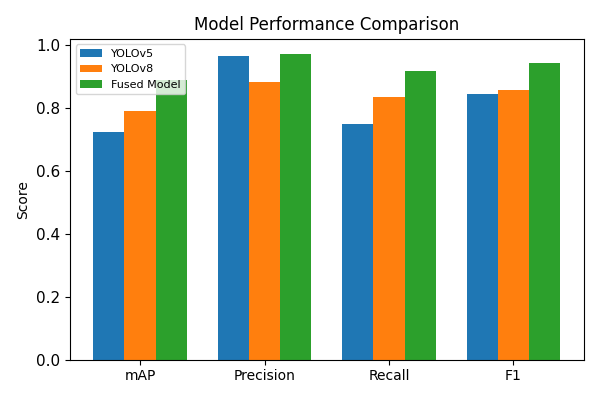

Metrics plot displayed once.
Saved summary report to: /content/drive/MyDrive/locust_detection/test_data/fusion/results/summary_report.txt


from matplotlib import pyplot as plt
_df_0['mAP'].plot(kind='hist', bins=20, title='mAP')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Precision'].plot(kind='hist', bins=20, title='Precision')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['Recall'].plot(kind='hist', bins=20, title='Recall')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['F1'].plot(kind='hist', bins=20, title='F1')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('Model').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='mAP', y='Precision', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='Precision', y='Recall', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='Recall', y='F1', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['mAP']
  ys = series['Precision']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_8.sort_values('mAP', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('mAP')
_ = plt.ylabel('Precision')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['mAP']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'mAP'}, axis=1)
              .sort_values('mAP', ascending=True))
  xs = counted['mAP']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_9.sort_values('mAP', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('mAP')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Recall']
  ys = series['Precision']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('Recall', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Recall')
_ = plt.ylabel('Precision')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Recall']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Recall'}, axis=1)
              .sort_values('Recall', ascending=True))
  xs = counted['Recall']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_11.sort_values('Recall', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Model')):
  _plot_series(series, series_name, i)
  fig.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Recall')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_12['mAP'].plot(kind='line', figsize=(8, 4), title='mAP')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_13['Precision'].plot(kind='line', figsize=(8, 4), title='Precision')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_14['Recall'].plot(kind='line', figsize=(8, 4), title='Recall')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_15['F1'].plot(kind='line', figsize=(8, 4), title='F1')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_16['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_16, x='mAP', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_17['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_17, x='Precision', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_18['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_18, x='Recall', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_19['Model'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_19, x='F1', y='Model', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [20]:
import torch
import yolov5
from ultralytics import YOLO
import numpy as np
import cv2
import os
from google.colab.patches import cv2_imshow
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Image

def load_annotations(label_path, image_path, fixed_size=(300, 300)):
    if not os.path.exists(label_path):
        print(f"No label file found for {image_path}")
        return np.array([]), np.array([])
    img_width, img_height = fixed_size
    boxes, classes = [], []
    with open(label_path, 'r') as f:
        for line in f:
            cls, x_center, y_center, width, height = map(float, line.strip().split())
            x1 = (x_center - width / 2) * img_width
            y1 = (y_center - height / 2) * img_height
            x2 = (x_center + width / 2) * img_width
            y2 = (y_center + height / 2) * img_height
            boxes.append([x1, y1, x2, y2])
            classes.append(int(cls))
    return np.array(boxes), np.array(classes)

def visualize_and_save_detections(image_path, boxes, scores, classes, gt_boxes, gt_classes, title, output_path, conf_thres=0.05):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return False
    for box, cls in zip(gt_boxes, gt_classes):
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, f'GT: {int(cls)}', (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    for box, score, cls in zip(boxes, scores, classes):
        if score >= conf_thres:
            x1, y1, x2, y2 = map(int, box)
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)
            label = f'Pred: {score:.2f}'
            cv2.putText(img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
    cv2.imwrite(output_path, img)
    print(f"Saved visualization: {output_path}")
    return True

def evaluate_predictions(predictions, ground_truths, iou_threshold=0.2):
    tp, fp, fn = 0, 0, 0
    all_scores = []
    all_matches = []
    for pred, gt in zip(predictions, ground_truths):
        pred_boxes, pred_scores, pred_classes = pred
        gt_boxes, gt_classes = gt
        if len(pred_boxes) == 0 and len(gt_boxes) > 0:
            fn += len(gt_boxes)
            continue
        if len(gt_boxes) == 0 and len(pred_boxes) > 0:
            fp += len(pred_boxes)
            continue
        if len(gt_boxes) == 0 and len(pred_boxes) == 0:
            continue
        ious = np.zeros((len(pred_boxes), len(gt_boxes)))
        for i, p_box in enumerate(pred_boxes):
            for j, g_box in enumerate(gt_boxes):
                ious[i, j] = compute_iou(p_box[None, :], g_box[None, :])[0]
        matched_gt = set()
        for i in np.argsort(pred_scores)[::-1]:
            if i >= len(ious):
                fp += 1
                continue
            max_iou = np.max(ious[i])
            if max_iou >= iou_threshold:
                j = np.argmax(ious[i])
                if j not in matched_gt and pred_classes[i] == gt_classes[j]:
                    tp += 1
                    matched_gt.add(j)
                    all_matches.append((pred_scores[i], 1))
                else:
                    fp += 1
                    all_matches.append((pred_scores[i], 0))
            else:
                fp += 1
                all_matches.append((pred_scores[i], 0))
        fn += len(gt_boxes) - len(matched_gt)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    all_matches = sorted(all_matches, key=lambda x: x[0], reverse=True)
    precisions = []
    recalls = []
    tp_cumsum = 0
    for i, (score, is_tp) in enumerate(all_matches):
        tp_cumsum += is_tp
        precisions.append(tp_cumsum / (i + 1))
        recalls.append(tp_cumsum / (tp + fn))
    ap = np.trapezoid(precisions, recalls) if recalls else 0
    return {"mAP": ap, "Precision": precision, "Recall": recall, "F1": f1, "TP": tp, "FP": fp, "FN": fn}

def plot_metrics(metrics_df, output_path):
    print("Generating metrics plot...")
    fig, ax = plt.subplots(figsize=(6, 4))  # Reduced size
    metrics = ['mAP', 'Precision', 'Recall', 'F1']
    x = np.arange(len(metrics))
    width = 0.25

    ax.bar(x - width, metrics_df[metrics].loc[metrics_df['Model'] == 'YOLOv5'].values[0], width, label='YOLOv5')
    ax.bar(x, metrics_df[metrics].loc[metrics_df['Model'] == 'YOLOv8'].values[0], width, label='YOLOv8')
    ax.bar(x + width, metrics_df[metrics].loc[metrics_df['Model'] == 'Fused Model'].values[0], width, label='Fused Model')

    ax.set_ylabel('Score', fontsize=10)
    ax.set_title('Model Performance Comparison', fontsize=12)
    ax.set_xticks(x)
    ax.set_xticklabels(metrics, fontsize=10)
    ax.legend(fontsize=8)
    plt.tight_layout()

    # Save to temporary file and display once
    temp_plot_path = '/content/temp_metrics_plot.png'
    plt.savefig(temp_plot_path, dpi=100)  # Lower DPI for smaller display
    plt.savefig(output_path, dpi=150)  # Higher DPI for saved file clarity
    print(f"Saved metrics plot: {output_path}")
    display(Image(filename=temp_plot_path))
    plt.close(fig)
    print("Metrics plot displayed once.")

def main():
    from google.colab import drive
    drive.mount('/content/drive')

    # Define paths
    yolov5_model_path = '/content/drive/MyDrive/locust_detection/yolov5/runs/train/augmented3/exp2/weights/best.pt'
    yolov8_model_path = '/content/drive/MyDrive/yolov8_model/robo yolo v8/augmented/yolov8_detection2/weights/best.pt'
    image_folder = '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/images'
    label_folder = '/content/drive/MyDrive/locust_detection/test_data/fusion/resized.fusion/labels'
    output_folder = '/content/drive/MyDrive/locust_detection/test_data/fusion/results'
    metrics_csv_path = os.path.join(output_folder, 'metrics_comparison.csv')
    metrics_plot_path = os.path.join(output_folder, 'metrics_comparison.png')
    summary_report_path = os.path.join(output_folder, 'summary_report.txt')

    # Create output folder
    os.makedirs(output_folder, exist_ok=True)

    # Load models
    print("Loading custom models...")
    yolov5_model = torch.hub.load('ultralytics/yolov5', 'custom', path=yolov5_model_path, force_reload=True)
    yolov8_model = YOLO(yolov8_model_path)

    # Load test images
    test_images = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith(('.jpg', '.png'))]
    test_images.sort()
    print(f"Found {len(test_images)} images: {test_images}")

    # Load ground truths
    ground_truths = []
    for img_path in test_images:
        label_path = os.path.join(label_folder, os.path.splitext(os.path.basename(img_path))[0] + '.txt')
        gt_boxes, gt_classes = load_annotations(label_path, img_path)
        ground_truths.append((gt_boxes, gt_classes))

    # Run predictions
    fusion_detector = YOLOFusion(yolov5_model, yolov8_model)
    print("Running batch predictions...")
    v5_results, v8_results, fused_results = fusion_detector.predict_batch(test_images, ground_truths)

    # Process results and save visualizations
    v5_preds, v8_preds, fused_preds = [], [], []
    visualization_paths = {'YOLOv5': [], 'YOLOv8': [], 'Fused Model': []}
    for image_path, gt, v5_result, v8_result, fused_result in zip(test_images, ground_truths, v5_results, v8_results, fused_results):
        v5_boxes, v5_scores, v5_classes = fusion_detector.process_results(*v5_result)
        v8_boxes, v8_scores, v8_classes = fusion_detector.process_results(*v8_result)
        fused_boxes, fused_scores, fused_classes = fusion_detector.process_results(*fused_result)

        v5_preds.append((v5_boxes, v5_scores, v5_classes))
        v8_preds.append((v8_boxes, v8_scores, v8_classes))
        fused_preds.append((fused_boxes, fused_scores, fused_classes))

        gt_boxes, gt_classes = gt
        image_name = os.path.splitext(os.path.basename(image_path))[0]

        # Save visualizations
        v5_output = os.path.join(output_folder, f"{image_name}_yolov5.jpg")
        v8_output = os.path.join(output_folder, f"{image_name}_yolov8.jpg")
        fused_output = os.path.join(output_folder, f"{image_name}_fused.jpg")

        visualize_and_save_detections(image_path, v5_boxes, v5_scores, v5_classes, gt_boxes, gt_classes, "YOLOv5 Predictions", v5_output)
        visualize_and_save_detections(image_path, v8_boxes, v8_scores, v8_classes, gt_boxes, gt_classes, "YOLOv8 Predictions", v8_output)
        visualize_and_save_detections(image_path, fused_boxes, fused_scores, fused_classes, gt_boxes, gt_classes, "Fused Model Predictions", fused_output)

        visualization_paths['YOLOv5'].append(v5_output)
        visualization_paths['YOLOv8'].append(v8_output)
        visualization_paths['Fused Model'].append(fused_output)

    # Evaluate predictions
    v5_metrics = evaluate_predictions(v5_preds, ground_truths)
    v8_metrics = evaluate_predictions(v8_preds, ground_truths)
    fused_metrics = evaluate_predictions(fused_preds, ground_truths)

    # Print debug info
    print("\nDebug Info:")
    print(f"YOLOv5 - TP: {v5_metrics['TP']}, FP: {v5_metrics['FP']}, FN: {v5_metrics['FN']}")
    print(f"YOLOv8 - TP: {v8_metrics['TP']}, FP: {v8_metrics['FP']}, FN: {v8_metrics['FN']}")
    print(f"Fused - TP: {fused_metrics['TP']}, FP: {fused_metrics['FP']}, FN: {fused_metrics['FN']}")

    # Create and display metrics DataFrame
    metrics_df = pd.DataFrame({
        'Model': ['YOLOv5', 'YOLOv8', 'Fused Model'],
        'mAP': [v5_metrics['mAP'], v8_metrics['mAP'], fused_metrics['mAP']],
        'Precision': [v5_metrics['Precision'], v8_metrics['Precision'], fused_metrics['Precision']],
        'Recall': [v5_metrics['Recall'], v8_metrics['Recall'], fused_metrics['Recall']],
        'F1': [v5_metrics['F1'], v8_metrics['F1'], fused_metrics['F1']]
    })

    print("\nComparison Table (Text):")
    print(metrics_df.to_string(index=False))
    print("\nComparison Table (Formatted):")
    display(metrics_df)
    metrics_df.to_csv(metrics_csv_path, index=False)
    print(f"Saved metrics to: {metrics_csv_path}")

    # Plot and display metrics comparison
    plot_metrics(metrics_df, metrics_plot_path)

    # Generate and save summary report
    with open(summary_report_path, 'w') as f:
        f.write("Locust Detection Model Comparison Report\n")
        f.write("=" * 40 + "\n\n")
        f.write("Debug Info:\n")
        f.write(f"YOLOv5 - TP: {v5_metrics['TP']}, FP: {v5_metrics['FP']}, FN: {v5_metrics['FN']}\n")
        f.write(f"YOLOv8 - TP: {v8_metrics['TP']}, FP: {v8_metrics['FP']}, FN: {v5_metrics['FN']}\n")
        f.write(f"Fused - TP: {fused_metrics['TP']}, FP: {fused_metrics['FP']}, FN: {fused_metrics['FN']}\n\n")
        f.write("Comparison Table:\n")
        f.write(metrics_df.to_string(index=False) + "\n\n")
        f.write("Visualization Paths:\n")
        for model, paths in visualization_paths.items():
            f.write(f"{model}:\n")
            for path in paths:
                f.write(f"  {path}\n")
        f.write(f"\nMetrics Plot: {metrics_plot_path}\n")
        f.write(f"Metrics CSV: {metrics_csv_path}\n")
    print(f"Saved summary report to: {summary_report_path}")

if __name__ == "__main__":
    main()